In [1]:
pip install nibabel

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install nnunetv2

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install SimpleITK

Note: you may need to restart the kernel to use updated packages.


Medical Image Resizing and Visualization:

This code performs the resizing of medical images and corresponding masks to a specified target dimension. 

It uses the SimpleITK library for reading and resampling the images, converting them to NumPy arrays. 

The code then visualizes axial, coronal, and sagittal slices of both the original and resized images, along with their segmented masks, using Matplotlib. 

The purpose is to demonstrate the impact of resizing on different anatomical views, aiding in the analysis and understanding of medical image data.

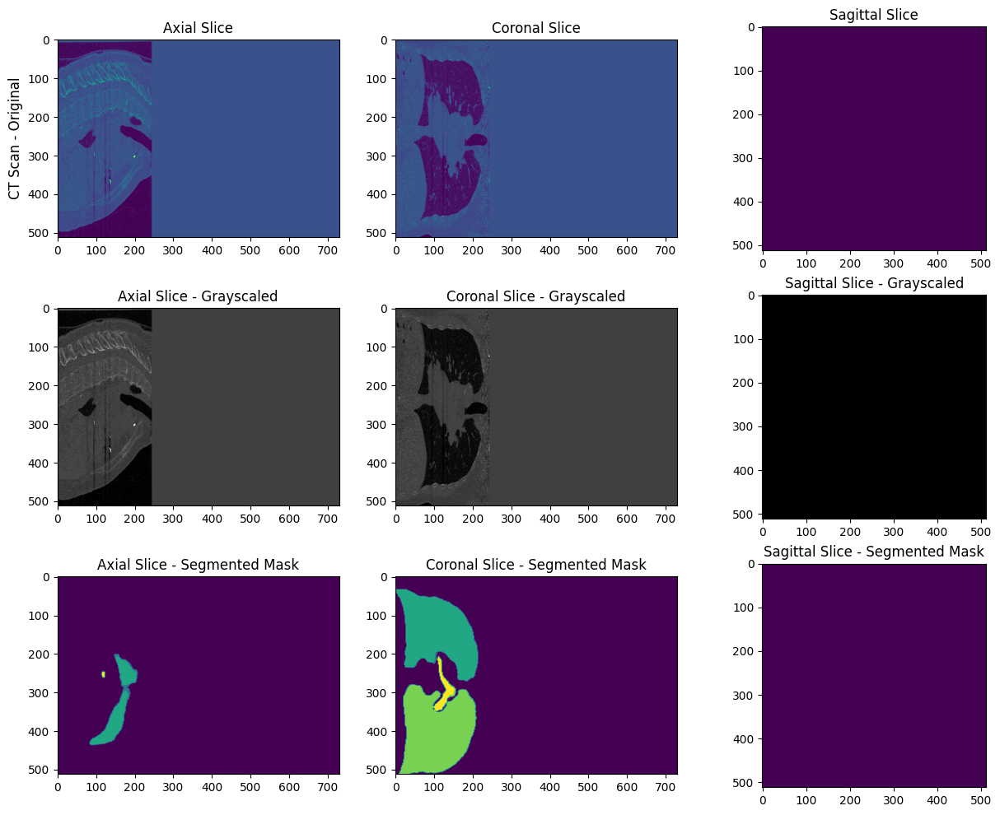

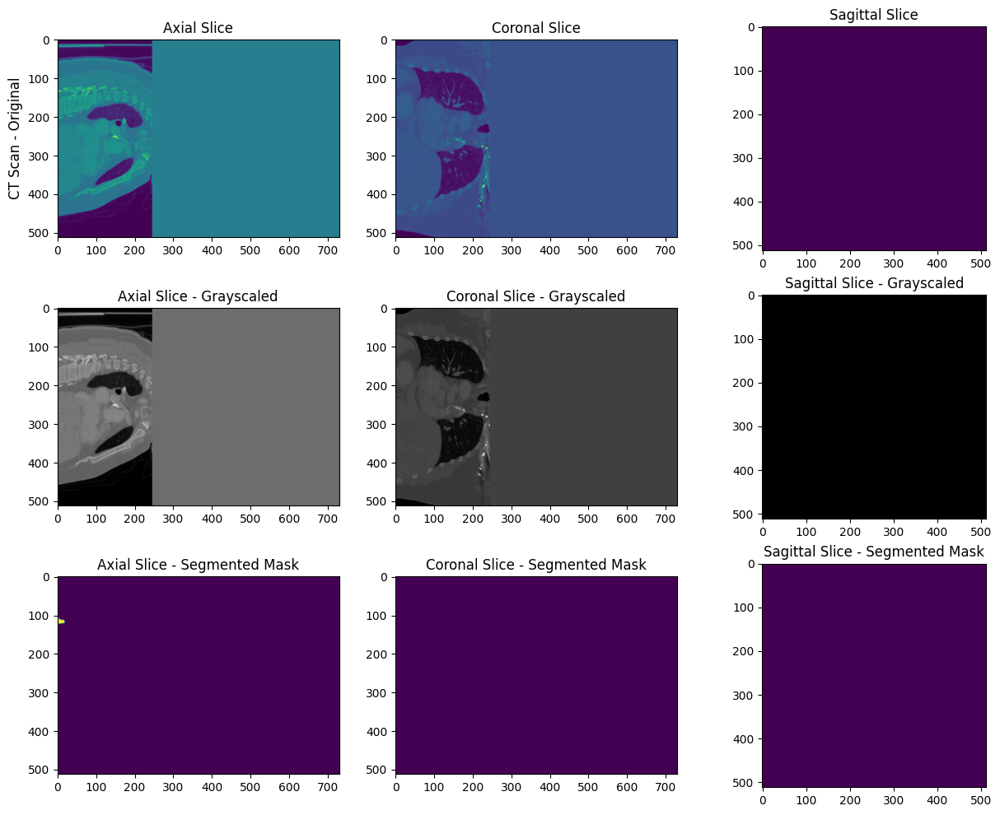

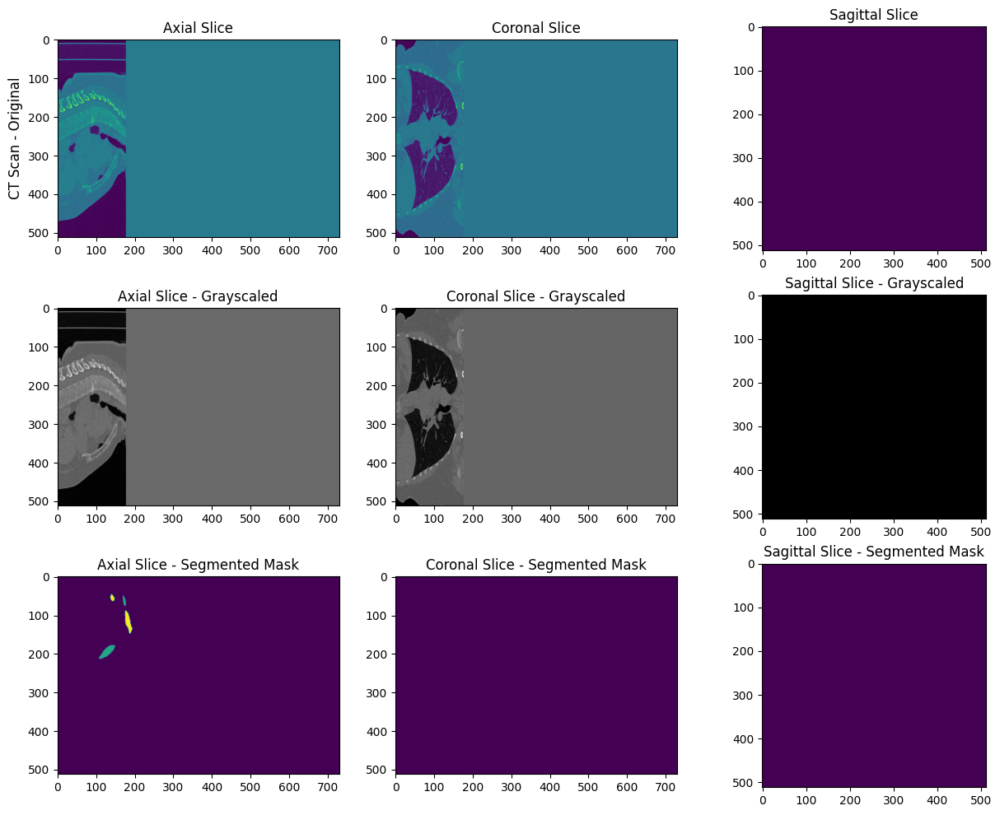

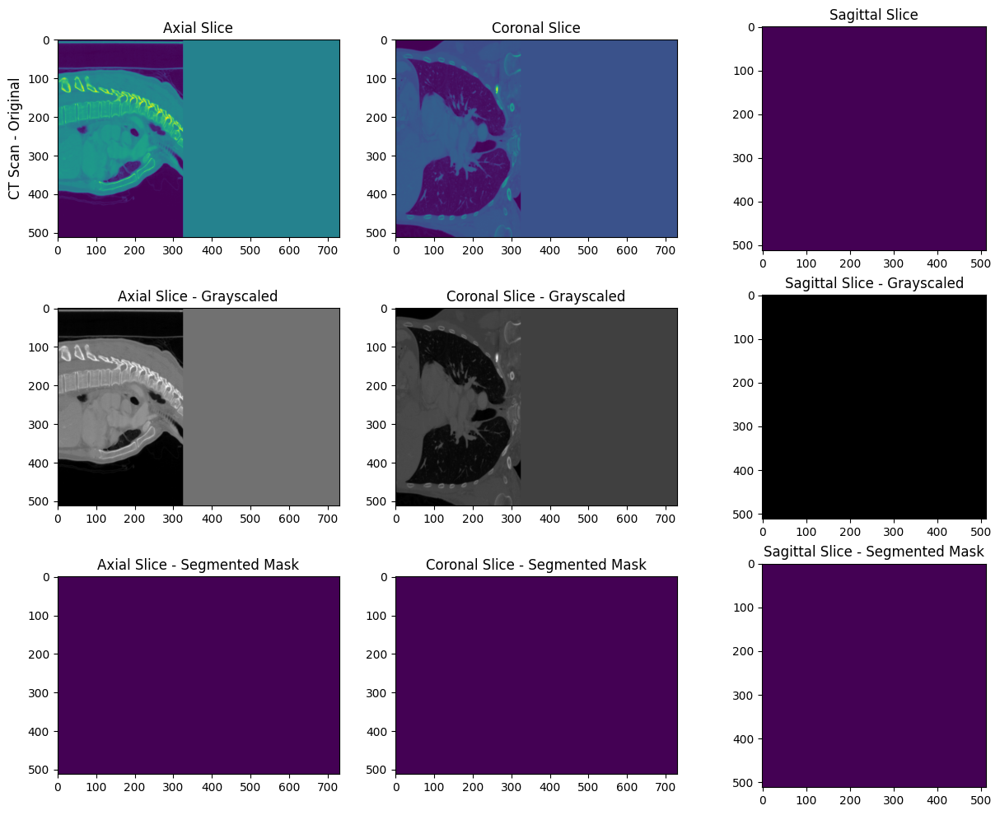

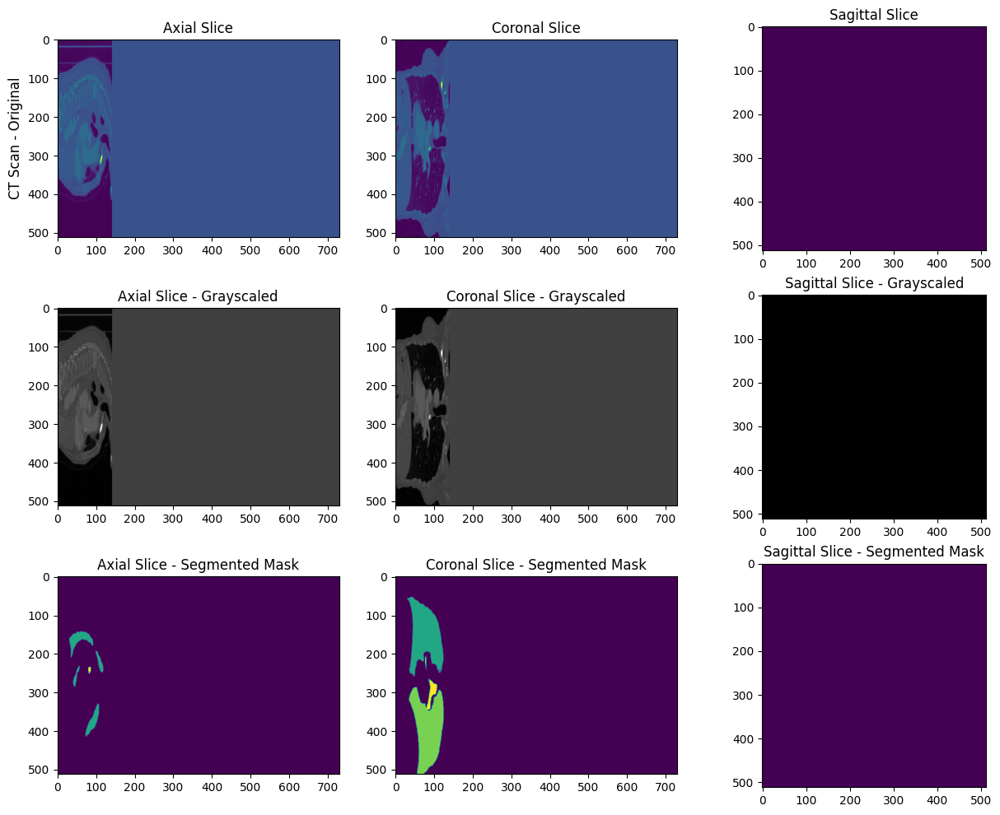

...

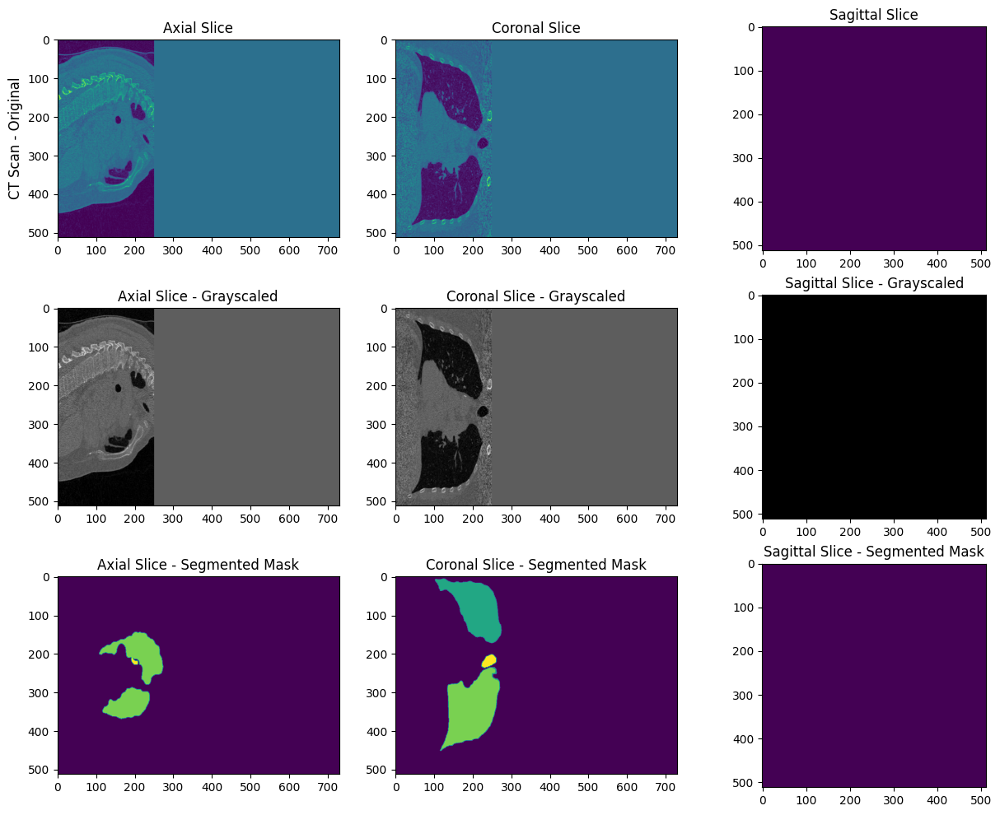

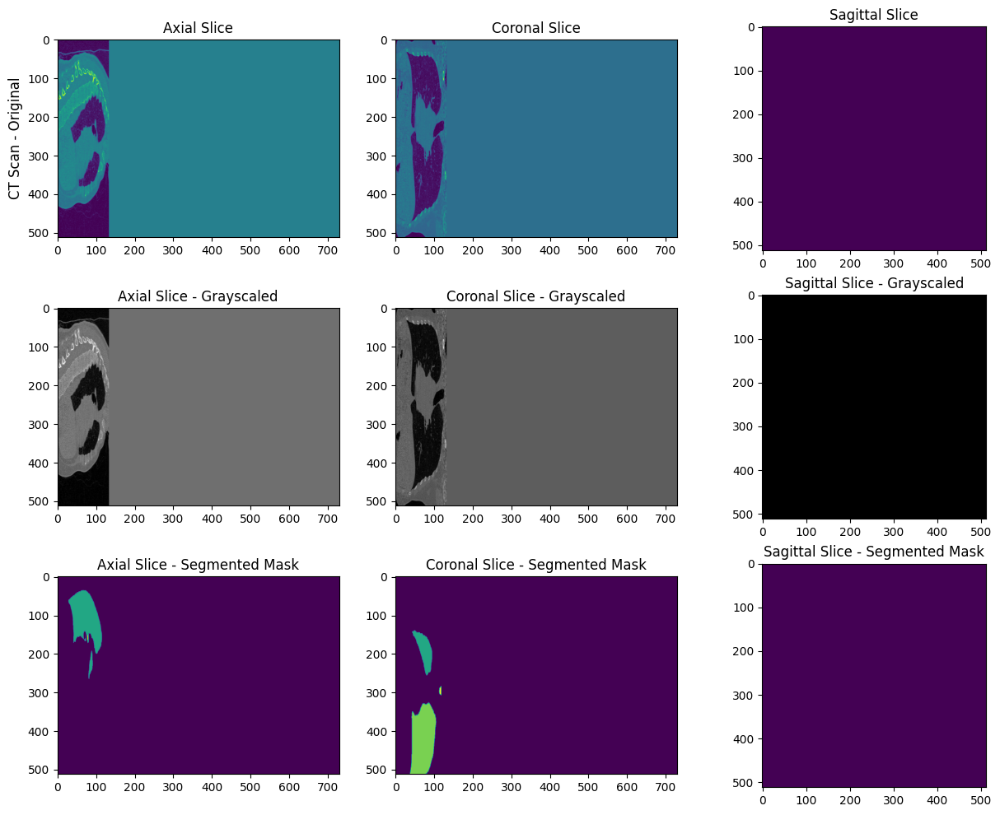

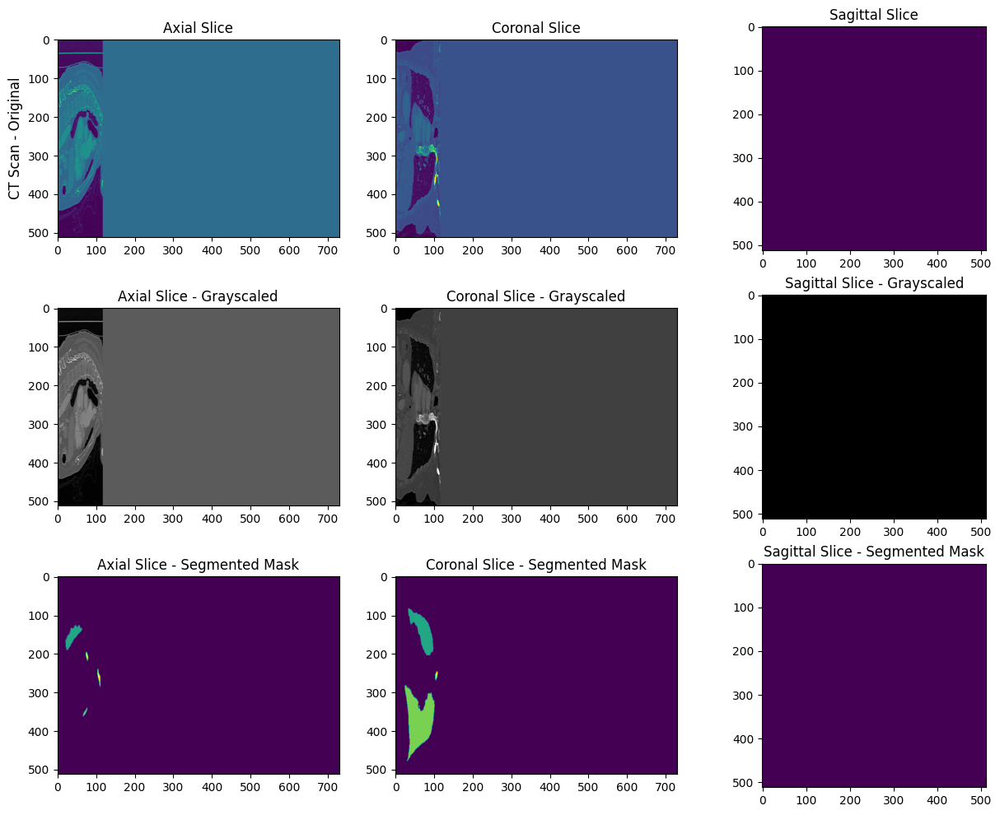

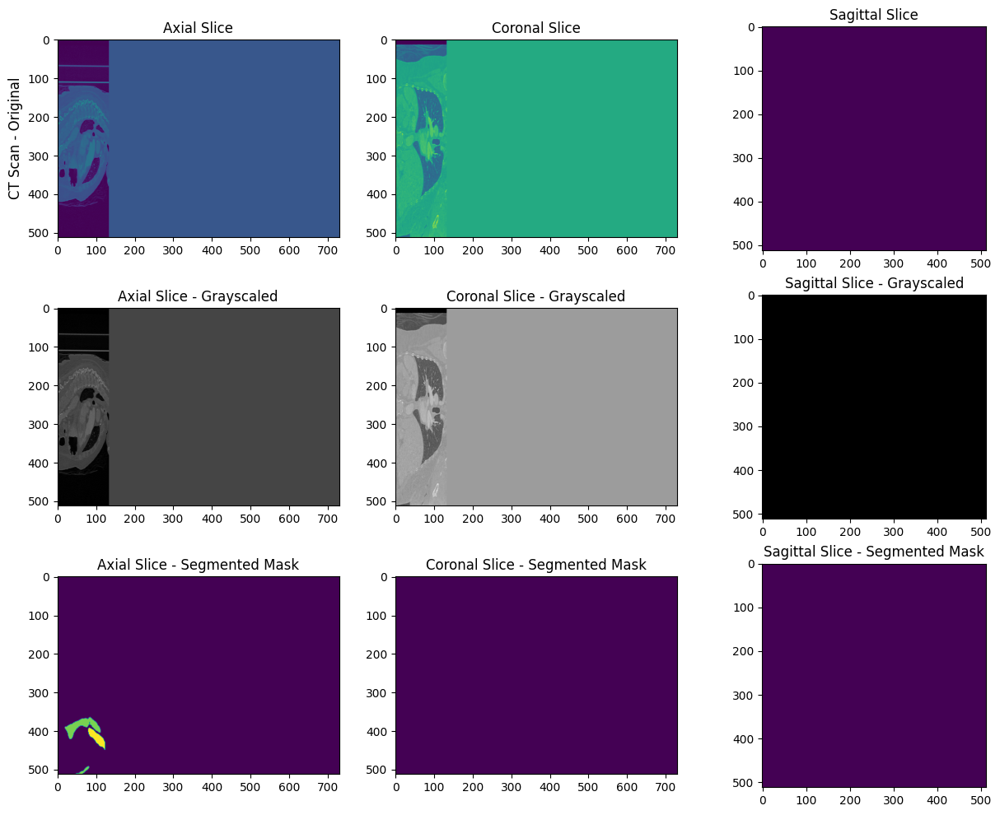

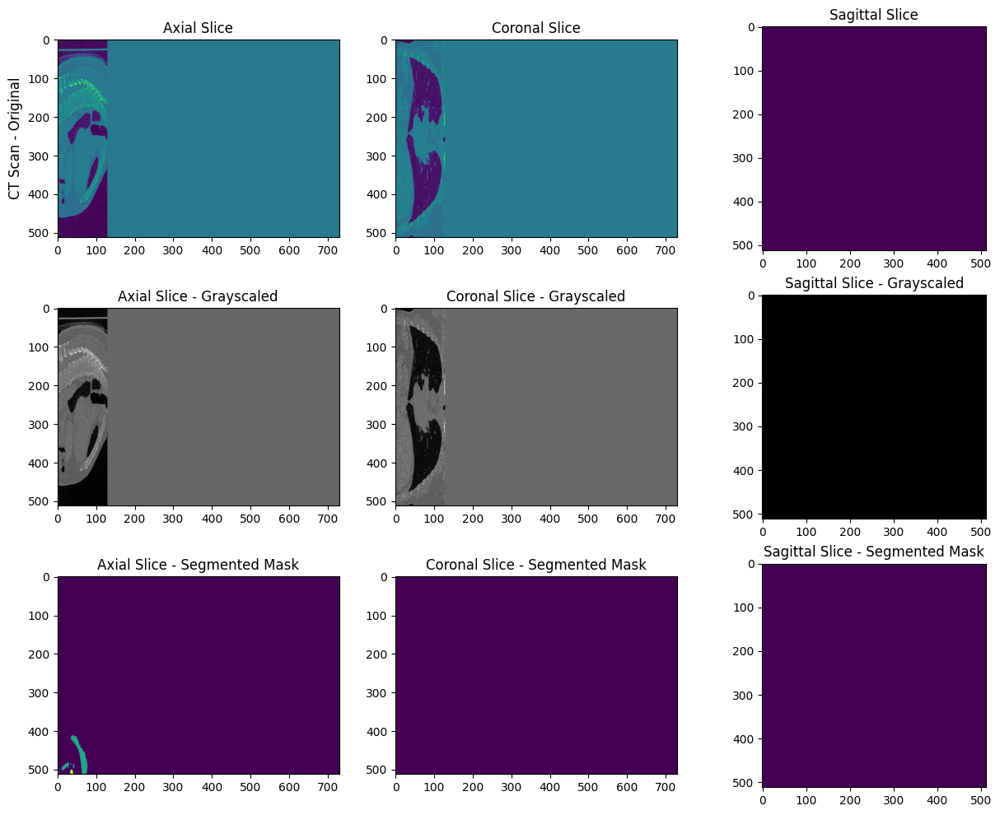

In [11]:
import os
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

# Set the path to the folders
images_folder = '/home/azureuser/rak/imagesTr'
labels_folder = '/home/azureuser/rak/labelsTr'

# Get the list of files in the folders
image_files = os.listdir(images_folder)
label_files = os.listdir(labels_folder)

# Set the target dimensions
target_dimensions = (512, 512, 730)

# Loop through each image and label
for image_file, label_file in zip(image_files, label_files):
    # Construct the full paths
    image_path = os.path.join(images_folder, image_file)
    label_path = os.path.join(labels_folder, label_file)

    # Read the image and label
    img_sitk = sitk.ReadImage(image_path, sitk.sitkFloat32)
    mask_sitk = sitk.ReadImage(label_path, sitk.sitkInt32)

    # Create empty images with the target dimensions
    image_resized = sitk.Image(target_dimensions, sitk.sitkFloat32)
    mask_resized = sitk.Image(target_dimensions, sitk.sitkInt32)

    # Resample the images to the target dimensions
    resampler = sitk.ResampleImageFilter()
    resampler.SetSize(target_dimensions)
    resampler.SetOutputSpacing(img_sitk.GetSpacing())
    resampler.SetOutputOrigin(img_sitk.GetOrigin())

    image_resized = resampler.Execute(img_sitk)
    mask_resized = resampler.Execute(mask_sitk)

    image_resized_np = sitk.GetArrayFromImage(image_resized)
    mask_resized_np = sitk.GetArrayFromImage(mask_resized)

    # Display the resized images
    zlen, ylen, xlen = image_resized_np.shape
    z_slice, y_slice, x_slice = zlen // 2, ylen // 2, xlen // 2

    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))

    # Axial Slice
    axes[0, 0].imshow(np.rot90(image_resized_np[:, :, x_slice]))
    axes[1, 0].imshow(np.rot90(image_resized_np[:, :, x_slice]), cmap="gray")
    axes[2, 0].imshow(np.rot90(mask_resized_np[:, :, x_slice]))

    # Coronal Slice
    axes[0, 1].imshow(np.rot90(image_resized_np[:, y_slice, :]))
    axes[1, 1].imshow(np.rot90(image_resized_np[:, y_slice, :]), cmap="gray")
    axes[2, 1].imshow(np.rot90(mask_resized_np[:, y_slice, :]))

    # Sagittal Slice
    axes[0, 2].imshow(np.rot90(image_resized_np[z_slice, :, :]))
    axes[1, 2].imshow(np.rot90(image_resized_np[z_slice, :, :]), cmap="gray")
    axes[2, 2].imshow(np.rot90(mask_resized_np[z_slice, :, :]))

    axes[0, 0].set_title("Axial Slice")
    axes[0, 0].set_ylabel("CT Scan - Original", fontsize=12)
    axes[1, 0].set_title("Axial Slice - Grayscaled")
    axes[2, 0].set_title("Axial Slice - Segmented Mask")

    axes[0, 1].set_title("Coronal Slice")
    axes[1, 1].set_title("Coronal Slice - Grayscaled")
    axes[2, 1].set_title("Coronal Slice - Segmented Mask")

    axes[0, 2].set_title("Sagittal Slice")
    axes[1, 2].set_title("Sagittal Slice - Grayscaled")
    axes[2, 2].set_title("Sagittal Slice - Segmented Mask")

    plt.show()

Medical Image Resizing and Saving: (image preprocessing and data manipulation)


This Python code resizes medical images and masks to a specified target dimension using a custom resizing function (resize_image_with_crop_or_pad). 

It reads original images and masks with SimpleITK, converts them to NumPy arrays, resizes them, and saves the results to separate folders. 

The code maintains spatial information and aims to prepare standardized medical image datasets for analysis or machine learning applications.

In [12]:
import os
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

def resize_image_with_crop_or_pad(image, img_size=None, **kwargs):
    """Image resizing. Resizes image by cropping or padding dimension
     to fit specified size.
    Args:
        image (np.ndarray): image to be resized
        img_size (list or tuple): new image size
        kwargs (): additional arguments to be passed to np.pad
    Returns:
        np.ndarray: resized image
    """

    assert isinstance(image, (np.ndarray, np.generic))
    assert (image.ndim - 1 == len(img_size) or image.ndim == len(img_size)), \
        'Example size doesnt fit image size'

    # Get the image dimensionality
    rank = len(img_size)

    # Create placeholders for the new shape
    from_indices = [[0, image.shape[dim]] for dim in range(rank)]
    to_padding = [[0, 0] for dim in range(rank)]

    slicer = [slice(None)] * rank

    # For each dimensions find whether it is supposed to be cropped or padded
    for i in range(rank):
        if image.shape[i] < img_size[i]:
            to_padding[i][0] = (img_size[i] - image.shape[i]) // 2
            to_padding[i][1] = img_size[i] - image.shape[i] - to_padding[i][0]
        else:
            from_indices[i][0] = int(np.floor((image.shape[i] - img_size[i]) / 2.))
            from_indices[i][1] = from_indices[i][0] + img_size[i]

        # Create slicer object to crop or leave each dimension
        slicer[i] = slice(from_indices[i][0], from_indices[i][1])

    # Pad the cropped image to extend the missing dimension
    return np.pad(image[tuple(slicer)], to_padding, **kwargs)

# Set the path to the folders
images_folder = '/home/azureuser/rak/imagesTr'
labels_folder = '/home/azureuser/rak/labelsTr'
output_images_folder = '/home/azureuser/rak/imagesresize'
output_labels_folder = '/home/azureuser/rak/labelsresize'

# Get the list of files in the folders
image_files = os.listdir(images_folder)
label_files = os.listdir(labels_folder)

# Set the target dimensions
target_dimensions = (730, 512, 512)

# Create the output folders if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Loop through each image and label
for image_file, label_file in zip(image_files, label_files):
    # Construct the full paths
    image_path = os.path.join(images_folder, image_file)
    label_path = os.path.join(labels_folder, label_file)

    # Read the image and label
    img_sitk = sitk.ReadImage(image_path, sitk.sitkFloat32)
    mask_sitk = sitk.ReadImage(label_path, sitk.sitkInt32)

    # Convert images to numpy arrays
    image_np = sitk.GetArrayFromImage(img_sitk)
    mask_np = sitk.GetArrayFromImage(mask_sitk)

    # Resize images using crop or pad
    resized_image_np = resize_image_with_crop_or_pad(image_np, img_size=target_dimensions, mode='constant')
    resized_mask_np = resize_image_with_crop_or_pad(mask_np, img_size=target_dimensions, mode='constant')

    # Create SimpleITK images from numpy arrays
    resized_image_sitk = sitk.GetImageFromArray(resized_image_np)
    resized_mask_sitk = sitk.GetImageFromArray(resized_mask_np)

    # Set the origin and spacing
    resized_image_sitk.SetOrigin(img_sitk.GetOrigin())
    resized_image_sitk.SetSpacing(img_sitk.GetSpacing())

    resized_mask_sitk.SetOrigin(mask_sitk.GetOrigin())
    resized_mask_sitk.SetSpacing(mask_sitk.GetSpacing())

    # Save resized images to separate folders for images and labels
    output_image_path = os.path.join(output_images_folder, f"{image_file}")
    output_label_path = os.path.join(output_labels_folder, f"{label_file}")

    sitk.WriteImage(resized_image_sitk, output_image_path)
    sitk.WriteImage(resized_mask_sitk, output_label_path)

Load and Visualize NIfTI Medical Images:

This code loads and displays slices from NIfTI (.nii.gz) medical image files. The load_nii_gz_and_plot_slice function uses SimpleITK to read the image, converts it to a NumPy array, and plots a specified slice using Matplotlib. 

The main loop iterates through .nii.gz files in a specified folder, prints the file being displayed, and visualizes a slice. 

The goal is to offer a rapid preview of the medical images in the folder, showcasing their content through slice visualization.


Displaying image: 1.3.6.1.4.1.14519.5.2.1.6279.6001.295420274214095686326263147663_0000.nii.gz


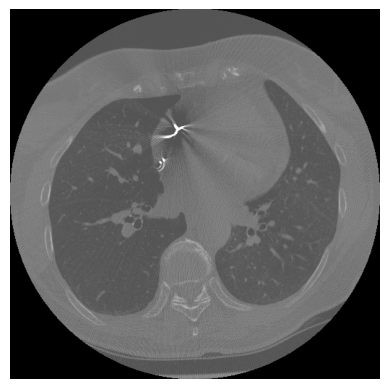

Displaying image: 1.3.6.1.4.1.14519.5.2.1.6279.6001.188376349804761988217597754952_0000.nii.gz


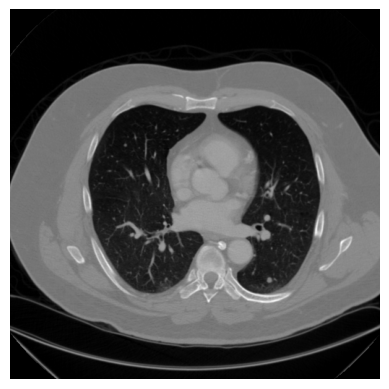

Displaying image: 1.3.6.1.4.1.14519.5.2.1.6279.6001.277445975068759205899107114231_0000.nii.gz


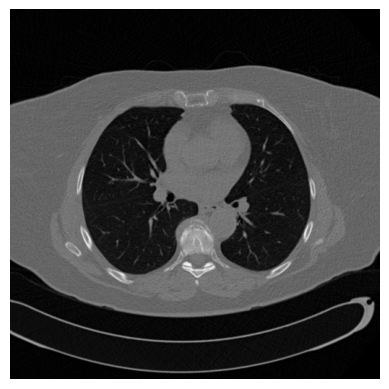

In [ ]:
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt

def load_nii_gz_and_plot_slice(file_path, slice_index=None):
    """Load a .nii.gz file and plot a specified slice."""
    # Read the image using SimpleITK
    img_sitk = sitk.ReadImage(file_path)

    # Convert to numpy array
    img_np = sitk.GetArrayFromImage(img_sitk)

    # If slice index is not specified, take the middle slice
    if slice_index is None:
        slice_index = img_np.shape[0] // 2

    # Plotting
    plt.imshow(img_np[slice_index], cmap='gray')
    plt.axis('off')
    plt.show()

# Set the path to the folder containing the images
images_folder = '/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/imagesTr'

# Get the list of .nii.gz files in the folder
nii_gz_files = [f for f in os.listdir(images_folder) if f.endswith('.nii.gz')]

# Print 3 images
for nii_gz_file in nii_gz_files[:3]:  # Adjust the number of images you want to display
    file_path = os.path.join(images_folder, nii_gz_file)
    print(f"Displaying image: {nii_gz_file}")
    load_nii_gz_and_plot_slice(file_path)


Visualizing NIfTI Medical Image Slices:

This code displays axial, coronal, and sagittal slices from a randomly chosen NIfTI (.nii.gz) medical image. 

Using SimpleITK, it reads the image, extracts slices, and visualizes them with Matplotlib. 

The code selects a random image from a specified folder, offering a quick and informative visualization of diverse anatomical views within the medical image.

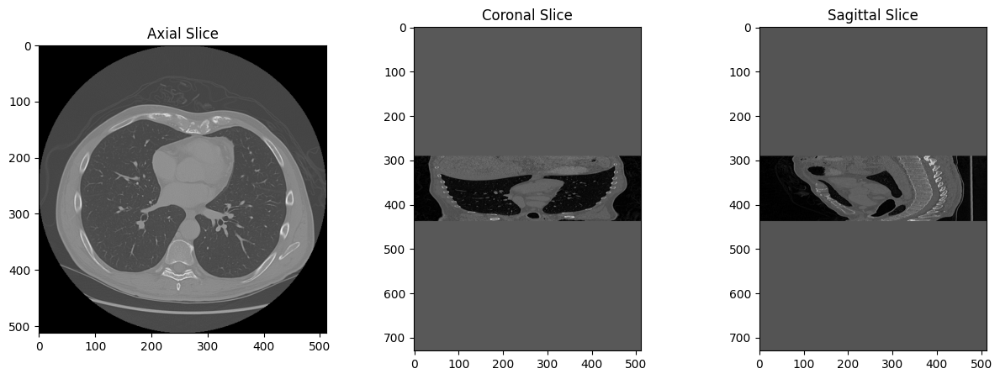

In [5]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import os
import numpy as np

def display_slices(image_path):
    """
    Display axial, coronal, and sagittal slices from a .nii.gz file.
    Args:
        image_path (str): Path to the .nii.gz file.
    """

    # Read the image using SimpleITK
    img_sitk = sitk.ReadImage(image_path, sitk.sitkFloat32)
    image_np = sitk.GetArrayFromImage(img_sitk)

    # Calculate the center slice of each dimension
    axial_slice = image_np[image_np.shape[0] // 2, :, :]
    coronal_slice = image_np[:, image_np.shape[1] // 2, :]
    sagittal_slice = image_np[:, :, image_np.shape[2] // 2]

    # Display each slice
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(axial_slice, cmap='gray')
    axes[0].set_title('Axial Slice')
    axes[1].imshow(coronal_slice, cmap='gray')
    axes[1].set_title('Coronal Slice')
    axes[2].imshow(sagittal_slice, cmap='gray')
    axes[2].set_title('Sagittal Slice')
    plt.show()

# Choose a random image from the output_images_folder
output_images_folder = '/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/imagesTr'
image_files = os.listdir(output_images_folder)
random_image_path = os.path.join(output_images_folder, np.random.choice(image_files))

# Display slices of the chosen image
display_slices(random_image_path)


Lung Mask Segmentation:

This Python code segments lung masks from medical labels by processing each label file. 

It reads the label, identifies left and right lungs, and creates a unified lung mask while excluding the trachea. 

The resulting lung mask is saved as a SimpleITK image in a designated output folder, refining the segmentation of lung structures from the original medical images.

In [13]:
import os
import SimpleITK as sitk
import numpy as np

# Input and output folders
input_labels_folder = '/home/azureuser/rak/labelsresize'
output_segmentation_folder = '/home/azureuser/rak/segmentation'

# Create the output segmentation folder if it doesn't exist
os.makedirs(output_segmentation_folder, exist_ok=True)

# List all files in the labels folder
label_files = os.listdir(input_labels_folder)

# Loop through each label
for label_file in label_files:
    # Construct the full path
    label_path = os.path.join(input_labels_folder, label_file)

    # Read the label
    label_sitk = sitk.ReadImage(label_path, sitk.sitkInt32)
    label_np = sitk.GetArrayFromImage(label_sitk)

    # Create masks for left lung, right lung, and trachea
    left_lung_mask = label_np == 3
    right_lung_mask = label_np == 4
    trachea_mask = label_np == 5

    # Merge left lung and right lung to label 1
    lung_mask = np.logical_or(left_lung_mask, right_lung_mask).astype(np.int32)

    # Set trachea to label 0
    lung_mask[trachea_mask] = 0

    # Create SimpleITK image from the merged lung mask
    lung_mask_sitk = sitk.GetImageFromArray(lung_mask)
    lung_mask_sitk.SetOrigin(label_sitk.GetOrigin())
    lung_mask_sitk.SetSpacing(label_sitk.GetSpacing())

    # Save the segmented lung mask
    output_path = os.path.join(output_segmentation_folder, f"{label_file}")
    sitk.WriteImage(lung_mask_sitk, output_path)

Visualizing Merged Lung Mask:

This code visualizes the merged lung mask obtained from a specific label file. 

The chosen label file is specified, and a colormap is defined. The axial slices of the merged lung mask are displayed using Matplotlib, with three slices showcased for illustration. 

The purpose is to provide a visual representation of the refined lung mask segmentation, highlighting the identified lung structures in blue on the black background.

Merged Lung Mask for /home/azureuser/rak/segmentation/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz:


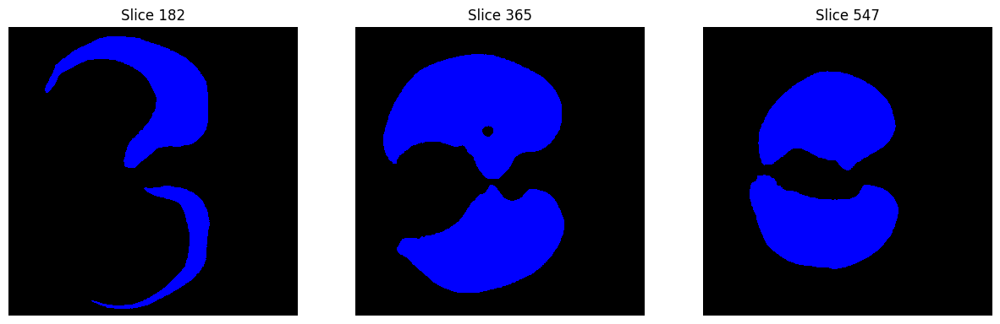

In [15]:
chosen_label_file = '/home/azureuser/rak/segmentation/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz' 
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
cmap = ListedColormap(['black', 'blue'])
# Print the merged lung mask
print(f"Merged Lung Mask for {chosen_label_file}:")

# Display three axial slices (change the slice indices as needed)
slices = [lung_mask.shape[0] // 4, lung_mask.shape[0] // 2, 3 * lung_mask.shape[0] // 4]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, slice_idx in enumerate(slices):
    axes[i].imshow(np.rot90(lung_mask[slice_idx, :, :]), cmap=cmap, origin='lower')
    axes[i].set_title(f"Slice {slice_idx}")
    axes[i].axis('off')

plt.show()

JSON Dataset Description Generation:

This Python code creates a JSON file describing a medical image dataset for neural network training. 

It iterates through image files, constructs paths to associated labels, and generates a JSON template with modality, licensing, dataset details, and references.

 The resulting JSON file provides a comprehensive dataset description, aiding in the training of neural networks for medical image analysis.

In [18]:
import os
import json

# Input folders
input_images_folder = '/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/imagesTr'
input_labels_folder = '/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/labelsTr'

# List all files in the images folder
image_files = os.listdir(input_images_folder)

# Initialize the training array
training_data = []

# Loop through each image file
for image_file in image_files:
    # Remove the trailing "_0000" from the image file name
    image_file_no_suffix = image_file.rsplit('_', 1)[0]

    # Construct the full paths
    image_path = os.path.join(input_images_folder, image_file)
    label_file = f"{image_file_no_suffix}.nii.gz"
    label_path = os.path.join(input_labels_folder, label_file)

    # Create a dictionary entry for each image
    entry = {
        "image": image_path,
        "label": label_path
    }

    # Append the entry to the training data array
    training_data.append(entry)

# Complete the JSON template
json_template = {
    "description": "",
    "labels": {
        "background": 0,
        "nnUNet": 1
    },
    "modality": {
        "CT": 0
    },
    "licence": "hands off!",
    "name": "Dataset099",
    "numTraining": len(training_data),
    "reference": "",
    "release": "0.0",
    "tensorImageSize": "3D",
    "channel_names": {"CT": 0},
    "file_ending": ".nii.gz",
    "training": training_data
}

# Save the JSON to a file
output_json_path = 'dataset.json'
with open(output_json_path, 'w') as json_file:
    json.dump(json_template, json_file, indent=4)

In [3]:
#export nnUNet_raw="/home/azureuser/rak/Data/nnUNet_raw_data_base
#export nnUNet_preprocessed="/home/azureuser/rak/Data/nnUNet_preprocessed"
#export nnUNet_results="/home/azureuser/rak/Data/nnUNet_trained_models"

#nnUNetv2_plan_and_preprocess -d 99
#nnUNetv2_train Dataset099Lung 3d_fullres 0
#nnUNetv2_predict -d Dataset099Lung -i /home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/imagesTs -o /home/azureuser/rak/Data/nnUNet_trained_models/Dataset099Lung/inference -f  0 1 -tr nnUNetTrainer -c 3d_fullres -p nnUNetPlans

#the checkpoints are saved in
#/home/azureuser/rak/Data/nnUNet_trained_models/Dataset099Lung/nnUNetTrainer__nnUNetPlans__3d_fullres/fold_1/checkpoint_latest.pth
#/home/azureuser/rak/Data/nnUNet_trained_models/Dataset099Lung/nnUNetTrainer__nnUNetPlans__3d_fullres/fold_0/checkpoint_latest.pth


Dice Coefficient Comparison for Predicted Masks:

This Python code evaluates the similarity between predicted and actual medical image segmentation masks using the Dice coefficient. 

It retrieves and sorts lists of .nii.gz files from specified directories. 

The Dice coefficient function assesses the overlap between masks, and the code iterates through pairs of filenames to compute and print the Dice coefficient for each pair. 

The results provide a quantitative measure of segmentation accuracy.

In [15]:
import os
import numpy as np
import nibabel as nib

# Directories where the predicted and actual .nii.gz files are stored
predicted_dir = '/home/azureuser/rak/Data/nnUNet_trained_models/Dataset099Lung/inference'
actual_dir = '/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/labelsTr'

# Generate lists of .nii.gz files in the predicted and actual directories
predicted = [f for f in os.listdir(predicted_dir) if f.endswith('.nii.gz')]
actual = [f for f in os.listdir(actual_dir) if f.endswith('.nii.gz')]

# Sort the lists to ensure they are in the same order, if necessary
predicted.sort()
actual.sort()

# Define the Dice coefficient function
def dice_coef(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask * groundtruth_mask)
    total_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
    dice = 2.0 * intersect / total_sum
    return round(dice, 3)  # round up to 3 decimal places

# Loop over the filenames
for i, j in zip(predicted, actual):
    pred_mask = nib.load(os.path.join(predicted_dir, i)).get_fdata()
    true_mask = nib.load(os.path.join(actual_dir, j)).get_fdata()
    dice_score = dice_coef(true_mask, pred_mask)
    print(f"Dice score for {i} against {j}: {dice_score}")



Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.nii.gz: 0.973
Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.nii.gz: 0.975
Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.nii.gz: 0.966
Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987.nii.gz: 0.973
Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.122763913896761494371822656720.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.122763913896761494371822656720.nii.gz: 0.955
Dice score for 1.3.6.1.4.1.14519.5.2.1.6279.6001.124154461048929153767743874565.nii.gz against 1.3.6.1.4.1.14519.5.2.1.6279.6001.1

Visualizing Predicted and Ground Truth Slices:

This Python code enables the quick visual comparison of slices from predicted and ground truth medical image segmentation masks. 

It loads .nii.gz files, selects middle slices, and displays corresponding pairs side by side. 

The functions plot_slice and print_nii_files collectively handle the loading and plotting process, offering a concise and informative assessment of segmentation results. 

The provided example usage demonstrates the visual comparison for a specific dataset.

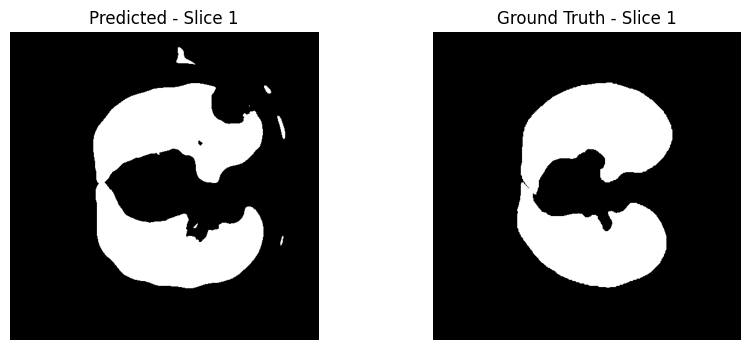

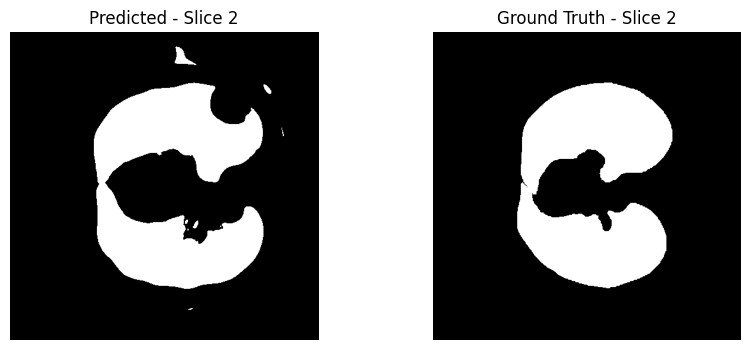

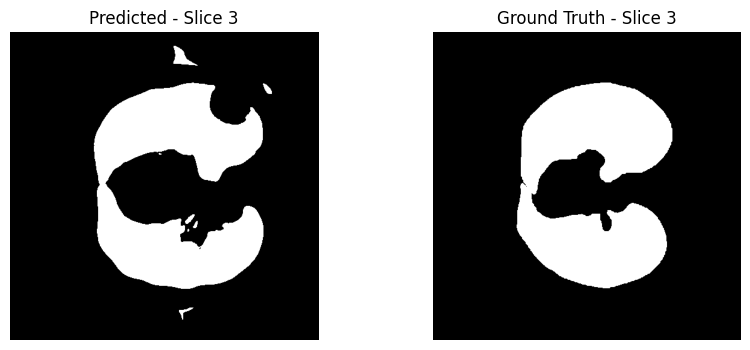

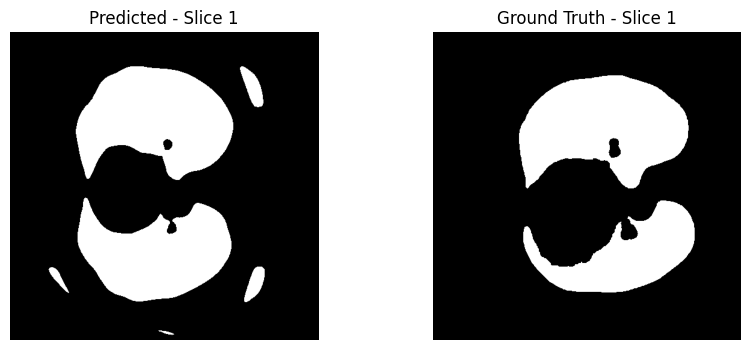

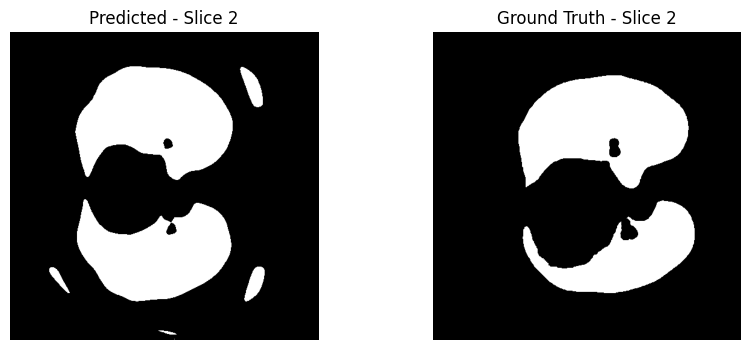

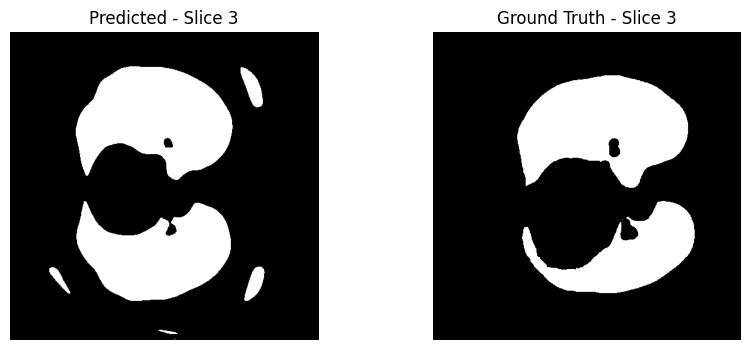

In [2]:
import nibabel as nib
import os
import matplotlib.pyplot as plt

def plot_slice(data, title):
    """ Plot a single slice """
    plt.imshow(data, cmap='gray')
    plt.title(title)
    plt.axis('off')

def print_nii_files(predicted_folder, ground_truth_folder, num_files=2, slices_to_show=3):
    predicted_files = [f for f in os.listdir(predicted_folder) if f.endswith('.nii.gz')]
    ground_truth_files = [f for f in os.listdir(ground_truth_folder) if f.endswith('.nii.gz')]

    for i in range(min(num_files, len(predicted_files), len(ground_truth_files))):
        pred_file = predicted_files[i]
        gt_file = ground_truth_files[i]

        pred_path = os.path.join(predicted_folder, pred_file)
        gt_path = os.path.join(ground_truth_folder, gt_file)

        # Load the .nii.gz files
        pred_data = nib.load(pred_path).get_fdata()
        gt_data = nib.load(gt_path).get_fdata()

        # Selecting the middle slices to show
        pred_slices = [pred_data[:, :, int(pred_data.shape[2] / 2) - s] for s in range(slices_to_show)]
        gt_slices = [gt_data[:, :, int(gt_data.shape[2] / 2) - s] for s in range(slices_to_show)]

        # Plotting the slices
        for s in range(slices_to_show):
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 2, 1)
            plot_slice(pred_slices[s], f'Predicted - Slice {s+1}')
            plt.subplot(1, 2, 2)
            plot_slice(gt_slices[s], f'Ground Truth - Slice {s+1}')
            plt.show()

# Example usage
print_nii_files("/home/azureuser/rak/Dataset099Lung/inference", "/home/azureuser/rak/Data/nnUNet_raw_data_base/Dataset099Lung/labelsTr")
